<a href="https://colab.research.google.com/github/hananeassenal/Algorithme-de-r-solution/blob/main/ML_pipeline_Adrija.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
df=pd.read_csv("LoanExport.csv")
df

<ipython-input-335-8ba8786b16ba>:4: DtypeWarning: Columns (18) have mixed types. Specify dtype option on import or set low_memory=False.
  df=pd.read_csv("LoanExport.csv")


,CreditScore,FirstPaymentDate,FirstTimeHomebuyer,MaturityDate,MSA,MIP,Units,Occupancy,OCLTV,DTI,...,PostalCode,LoanSeqNum,LoanPurpose,OrigLoanTerm,NumBorrowers,SellerName,ServicerName,EverDelinquent,MonthsDelinquent,MonthsInRepayment
0,0,199902,N,202901,16974,25,1,O,89,27,...,60400,F199Q1268030,P,360,2,FL,WASHINGTONMUTUALBANK,0,0,52
1,0,199902,N,202901,19740,0,1,O,73,17,...,80200,F199Q1015092,N,360,1,FT,CHASEHOMEFINANCELLC,0,0,144
2,0,199902,N,202901,29940,0,1,O,75,16,...,66000,F199Q1266886,N,360,2,FL,WASHINGTONMUTUALBANK,0,0,67
3,0,199902,N,202901,31084,0,1,O,76,14,...,90700,F199Q1178167,N,360,2,GM,GMACMTGECORP,0,0,35
4,0,199902,N,202901,35644,0,1,O,78,18,...,7600,F199Q1178517,N,360,2,GM,GMACMTGECORP,0,0,54
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
223511,755,199904,N,202903,26900,12,1,O,81,31,...,46100,F199Q1215184,N,360,1,NO,WELLSFARGOHOMEMORTGA,0,0,52
223512,755,199904,N,202903,27260,0,1,O,67,34,...,32200,F199Q1397568,P,360,2,Ot,SUNTRUSTMORTGAGEINC,0,0,33
223513,755,199904,N,202903,27260,0,1,O,73,27,...,32200,F199Q1030693,P,360,2,CO,BANKOFAMERICANA,0,0,171
223514,755,199904,N,202903,27260,30,1,O,95,40,...,32200,F199Q1326285,P,360,2,BI,HOMESIDELENDINGINC,0,0,42


In [ ]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 223516 entries, 0 to 223515
Data columns (total 28 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   CreditScore         223516 non-null  int64  
 1   FirstPaymentDate    223516 non-null  int64  
 2   FirstTimeHomebuyer  223516 non-null  object 
 3   MaturityDate        223516 non-null  int64  
 4   MSA                 223516 non-null  object 
 5   MIP                 223516 non-null  int64  
 6   Units               223516 non-null  int64  
 7   Occupancy           223516 non-null  object 
 8   OCLTV               223516 non-null  int64  
 9   DTI                 223516 non-null  int64  
 10  OrigUPB             223516 non-null  int64  
 11  LTV                 223516 non-null  int64  
 12  OrigInterestRate    223516 non-null  float64
 13  Channel             223516 non-null  object 
 14  PPM                 223516 non-null  object 
 15  ProductType         223516 non-nul

In [ ]:
print(df.isnull().sum())

CreditScore               0
FirstPaymentDate          0
FirstTimeHomebuyer        0
MaturityDate              0
MSA                       0
MIP                       0
Units                     0
Occupancy                 0
OCLTV                     0
DTI                       0
OrigUPB                   0
LTV                       0
OrigInterestRate          0
Channel                   0
PPM                       0
ProductType               0
PropertyState             0
PropertyType              0
PostalCode                0
LoanSeqNum                0
LoanPurpose               0
OrigLoanTerm              0
NumBorrowers              0
SellerName            19161
ServicerName              0
EverDelinquent            0
MonthsDelinquent          0
MonthsInRepayment         0
dtype: int64


In [ ]:
df.drop(columns=[ 'PostalCode','LoanSeqNum',], inplace=True)

In [ ]:
df.dropna(subset=['SellerName'], inplace=True)

In [ ]:
for col in ['FirstPaymentDate', 'MaturityDate']:
    df[col] = pd.to_datetime(df[col], format='%Y%m')

In [ ]:
for col in ['FirstTimeHomebuyer', 'PPM']:
    df[col] = df[col].astype('object')

In [ ]:
df.sample(10)

,CreditScore,FirstPaymentDate,FirstTimeHomebuyer,MaturityDate,MSA,MIP,Units,Occupancy,OCLTV,DTI,...,PropertyState,PropertyType,LoanPurpose,OrigLoanTerm,NumBorrowers,SellerName,ServicerName,EverDelinquent,MonthsDelinquent,MonthsInRepayment
63446,668,1999-05-01,X,2029-04-01,42644,0,1,O,59,33,...,WA,SF,C,360,1,FL,CHASEMANHATTANMTGECO,0,0,50
55879,663,1999-03-01,X,2029-02-01,19740,12,1,O,78,32,...,CO,SF,C,360,2,FL,CHASEMANHATTANMTGECO,0,0,45
27112,638,1999-03-01,Y,2029-02-01,20764,30,1,O,95,33,...,NJ,SF,P,360,2,BI,Other servicers,1,27,103
11224,615,1999-03-01,Y,2029-02-01,33460,25,1,O,90,26,...,MN,SF,P,360,2,BA,BANKOFAMERICANA,0,0,15
140370,714,1999-05-01,X,2029-04-01,37964,0,1,O,69,31,...,PA,SF,C,360,1,Ot,Other servicers,1,1,48
153877,721,1999-05-01,N,2029-04-01,47894,0,1,O,75,29,...,VA,PU,P,360,2,CO,COUNTRYWIDE,0,0,46
194513,741,1999-05-01,N,2029-04-01,45780,0,1,O,55,26,...,OH,SF,C,360,1,ST,CITIMORTGAGEINC,0,0,153
21772,632,1999-03-01,N,2029-02-01,X,0,1,O,78,29,...,NC,PU,N,360,2,G,BANKOFAMERICANA,0,0,54
77832,678,1999-05-01,N,2029-04-01,45300,0,1,I,65,56,...,FL,SF,N,360,2,ST,CHASEMTGECO,0,0,46
42748,652,1999-05-01,X,2029-04-01,20764,0,1,O,78,38,...,NJ,SF,N,360,2,BA,BANKOFAMERICANA,0,0,209


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 204355 entries, 0 to 223515
Data columns (total 26 columns):
 #   Column              Non-Null Count   Dtype         
---  ------              --------------   -----         
 0   CreditScore         204355 non-null  int64         
 1   FirstPaymentDate    204355 non-null  datetime64[ns]
 2   FirstTimeHomebuyer  204355 non-null  object        
 3   MaturityDate        204355 non-null  datetime64[ns]
 4   MSA                 204355 non-null  object        
 5   MIP                 204355 non-null  int64         
 6   Units               204355 non-null  int64         
 7   Occupancy           204355 non-null  object        
 8   OCLTV               204355 non-null  int64         
 9   DTI                 204355 non-null  int64         
 10  OrigUPB             204355 non-null  int64         
 11  LTV                 204355 non-null  int64         
 12  OrigInterestRate    204355 non-null  float64       
 13  Channel             204355 non-nul

In [ ]:
non_numeric_msa_value = df[pd.to_numeric(df['MSA'], errors='coerce').isna()]['MSA'].unique()
if (len(non_numeric_msa_value) > 20):
  # Sample 20 of them if there are too many unique values
  print(f"Non-numeric values in MSA: {np.random.choice(non_numeric_msa_value, 20, replace=False)}")
else:
  print(f"Non-numeric values in MSA: {non_numeric_msa_value}")


Non-numeric values in MSA: ['X    ']


In [ ]:
df['MSA'] = df['MSA'].astype(str).str.strip()
df['MSA'] = pd.to_numeric(df['MSA'], errors='coerce')
mode_msa = df['MSA'].mode()[0]

# Fill missing values in `MSA` with the mode
df['MSA'] = df['MSA'].fillna(mode_msa)

# Print the first 5 rows
print(df.head(10))
df.to_csv("filteredMortgage.csv", index=False)

   CreditScore FirstPaymentDate FirstTimeHomebuyer MaturityDate      MSA  MIP  \
0            0       1999-02-01                  N   2029-01-01  16974.0   25   
1            0       1999-02-01                  N   2029-01-01  19740.0    0   
2            0       1999-02-01                  N   2029-01-01  29940.0    0   
3            0       1999-02-01                  N   2029-01-01  31084.0    0   
4            0       1999-02-01                  N   2029-01-01  35644.0    0   
5            0       1999-02-01                  N   2029-01-01  31084.0   25   
6            0       1999-02-01                  N   2029-01-01  31084.0   25   
7            0       1999-02-01                  X   2029-01-01  36740.0    0   
8            0       1999-02-01                  Y   2027-10-01  25540.0   30   
9            0       1999-02-01                  Y   2029-01-01  48620.0   30   

   Units Occupancy  OCLTV  DTI  ...  PropertyState  PropertyType  LoanPurpose  \
0      1         O     89  

In [ ]:
bins = [300, 580, 670, 740, 800, 851]
labels = ['Poor', 'Fair', 'Good', 'Very Good', 'Exceptional']
df['CreditScoreGroup'] = pd.cut(df['CreditScore'], bins=bins, labels=labels, right=False)


In [ ]:
df['RepaymentYearsGroup'] = np.ceil(df['MonthsInRepayment'] / 12).astype(int).astype(str) + ' Years'


In [ ]:
bins = [0, 75, 80, 85, 90, 95, 101]
labels = ['<=75%', '75-80%', '80-85%', '85-90%', '90-95%', '>95%']
df['LTVGroup'] = pd.cut(df['LTV'], bins=bins, labels=labels, right=False)

In [ ]:
for col in ['CreditScoreGroup', 'RepaymentYearsGroup', 'LTVGroup']:
    df[col] = df[col].astype('category')

In [ ]:
print(df[['CreditScore', 'CreditScoreGroup', 'MonthsInRepayment', 'RepaymentYearsGroup', 'LTV', 'LTVGroup', 'FirstTimeHomebuyer']].head(10))

   CreditScore CreditScoreGroup  MonthsInRepayment RepaymentYearsGroup  LTV  \
0            0              NaN                 52             5 Years   89   
1            0              NaN                144            12 Years   73   
2            0              NaN                 67             6 Years   75   
3            0              NaN                 35             3 Years   76   
4            0              NaN                 54             5 Years   78   
5            0              NaN                 42             4 Years   89   
6            0              NaN                 44             4 Years   90   
7            0              NaN                145            13 Years   72   
8            0              NaN                 64             6 Years   95   
9            0              NaN                212            18 Years   95   

  LTVGroup FirstTimeHomebuyer  
0   85-90%                  N  
1    <=75%                  N  
2   75-80%                  N  
3 

In [ ]:
df_filtered = df.select_dtypes(include=['int64', 'float64'])

In [ ]:
summary_stats = df_filtered.describe(percentiles=[.25, .75])
summary_stats

,CreditScore,MSA,MIP,Units,OCLTV,DTI,OrigUPB,LTV,OrigInterestRate,OrigLoanTerm,EverDelinquent,MonthsDelinquent,MonthsInRepayment
count,204355.000000,204355.000000,204355.000000,204355.000000,204355.000000,204355.000000,204355.000000,204355.000000,204355.000000,204355.000000,204355.000000,204355.000000,204355.000000
mean,689.183935,30791.886883,10.317311,1.025226,78.794074,31.113513,126268.914389,78.771985,6.945817,359.850867,0.231362,2.269022,59.882733
std,66.017760,10524.372827,12.967735,0.197350,13.998176,13.070105,53027.772490,13.988267,0.350694,2.147938,0.421704,9.778830,45.422285
min,0.000000,10180.000000,0.000000,0.000000,0.000000,0.000000,9000.000000,0.000000,4.750000,301.000000,0.000000,0.000000,1.000000
25%,663.000000,20764.000000,0.000000,1.000000,73.000000,24.000000,85000.000000,73.000000,6.750000,360.000000,0.000000,0.000000,34.000000
50%,699.000000,31084.000000,0.000000,1.000000,80.000000,32.000000,119000.000000,80.000000,6.875000,360.000000,0.000000,0.000000,48.000000
75%,728.000000,39300.000000,25.000000,1.000000,90.000000,40.000000,161000.000000,90.000000,7.125000,360.000000,0.000000,0.000000,62.000000
max,755.000000,49740.000000,52.000000,4.000000,110.000000,65.000000,497000.000000,103.000000,12.350000,361.000000,1.000000,180.000000,212.000000


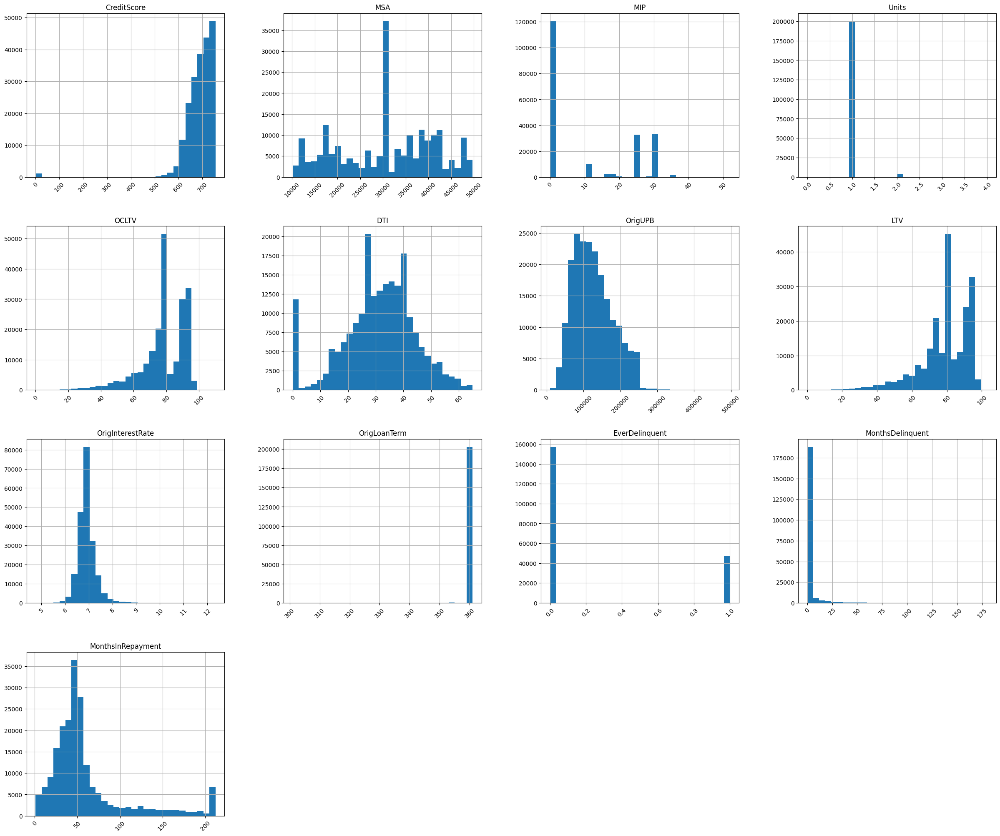

In [ ]:
df_filtered.hist(bins=30,figsize=(30,25),xrot=45)
plt.show()

In [ ]:
!pip install altair


In [ ]:
import altair as alt
import pandas as pd

# Filter to include only int64 and float64 columns, excluding `FirstPaymentDate` and `MaturityDate`
df_filtered = df.select_dtypes(include=['int64', 'float64'])

# Sample 1% of the dataframe without replacement
df_sampled = df_filtered.sample(frac=0.01, replace=False)

# Create a figure with subplots arranged in 3 rows and 4 columns
fig = alt.vconcat(data=df_sampled)
for i, col in enumerate(df_sampled.columns):
    # Create a scatter plot for the current column against the index
    chart = alt.Chart(df_sampled.reset_index()).mark_circle().encode(
        x=alt.X('index:Q', title='Index'),
        y=alt.Y(col, title=col),
        tooltip=['index', col]
    ).properties(
        title=f'Scatter Plot of {col} vs. Index'
    )

    # Add the chart to the figure
    fig &= chart

# Adjust layout to prevent overlapping elements
fig = fig.resolve_scale(
    x='independent',
    y='independent'
)

# Save the chart
fig.display()


alt.VConcatChart(...)

In [ ]:
correlation_pearson = df_filtered.corr(method='pearson')
correlation_pearson

,CreditScore,MSA,MIP,Units,OCLTV,DTI,OrigUPB,LTV,OrigInterestRate,OrigLoanTerm,EverDelinquent,MonthsDelinquent,MonthsInRepayment
CreditScore,1.000000,0.002744,-0.091838,0.001226,-0.093703,-0.032551,0.036606,-0.093906,-0.096925,0.004427,-0.163070,-0.124099,-0.032157
MSA,0.002744,1.000000,-0.043866,-0.004987,-0.046356,0.018431,0.066936,-0.045968,0.021425,0.000750,-0.009634,-0.019178,-0.023077
MIP,-0.091838,-0.043866,1.000000,-0.046351,0.723422,0.096633,0.000044,0.724572,0.123688,0.013779,0.036341,0.038602,-0.085989
Units,0.001226,-0.004987,-0.046351,1.000000,-0.057297,0.009742,0.039491,-0.057168,0.072945,0.005031,0.009310,-0.004668,0.026052
OCLTV,-0.093703,-0.046356,0.723422,-0.057297,1.000000,0.094390,0.076228,0.999388,0.092318,0.018313,0.038975,0.046742,-0.086768
DTI,-0.032551,0.018431,0.096633,0.009742,0.094390,1.000000,0.064331,0.093858,0.094901,0.027342,0.047946,0.033948,0.002522
OrigUPB,0.036606,0.066936,0.000044,0.039491,0.076228,0.064331,1.000000,0.075632,-0.140292,-0.000592,-0.080544,-0.079327,-0.205154
LTV,-0.093906,-0.045968,0.724572,-0.057168,0.999388,0.093858,0.075632,1.000000,0.092583,0.018220,0.039218,0.046882,-0.086961
OrigInterestRate,-0.096925,0.021425,0.123688,0.072945,0.092318,0.094901,-0.140292,0.092583,1.000000,0.000612,0.054968,0.049283,-0.111555
OrigLoanTerm,0.004427,0.000750,0.013779,0.005031,0.018313,0.027342,-0.000592,0.018220,0.000612,1.000000,0.008530,0.006174,0.015299


In [ ]:
s=(df.dtypes=='object')
object_cols=list(s[s].index)
print("Categorical variables in dataset:")
print(object_cols)

Categorical variables in dataset:
['FirstTimeHomebuyer', 'Occupancy', 'Channel', 'PPM', 'ProductType', 'PropertyState', 'PropertyType', 'LoanPurpose', 'NumBorrowers', 'SellerName', 'ServicerName']


In [ ]:
df_filt = df.select_dtypes(include=['object'])
df_filt.head(10)

,FirstTimeHomebuyer,Occupancy,Channel,PPM,ProductType,PropertyState,PropertyType,LoanPurpose,NumBorrowers,SellerName,ServicerName
0,N,O,T,N,FRM,IL,SF,P,2,FL,WASHINGTONMUTUALBANK
1,N,O,R,N,FRM,CO,SF,N,1,FT,CHASEHOMEFINANCELLC
2,N,O,T,N,FRM,KS,SF,N,2,FL,WASHINGTONMUTUALBANK
3,N,O,R,N,FRM,CA,SF,N,2,GM,GMACMTGECORP
4,N,O,R,N,FRM,NJ,SF,N,2,GM,GMACMTGECORP
5,N,O,T,N,FRM,CO,SF,N,2,Ot,Other servicers
6,N,O,T,N,FRM,WI,SF,P,1,RE,Other servicers
7,X,O,R,N,FRM,FL,SF,N,1,NO,WELLSFARGOBANKNA
8,Y,O,R,X,FRM,CT,SF,P,1,Ot,Other servicers
9,Y,O,T,N,FRM,KS,SF,P,1,Ot,WELLSFARGOBANKNA


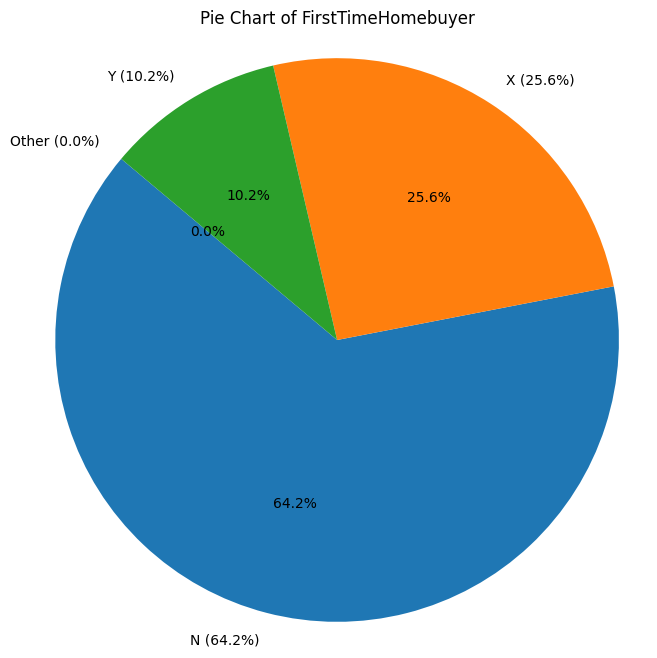

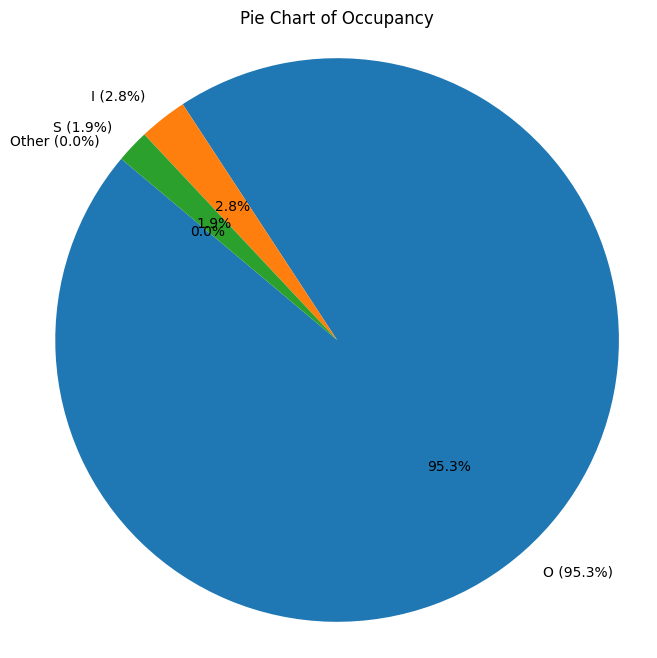

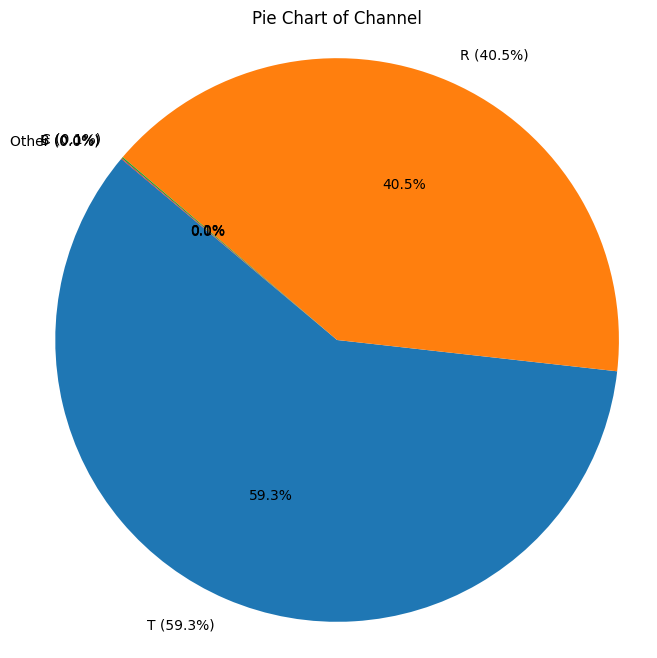

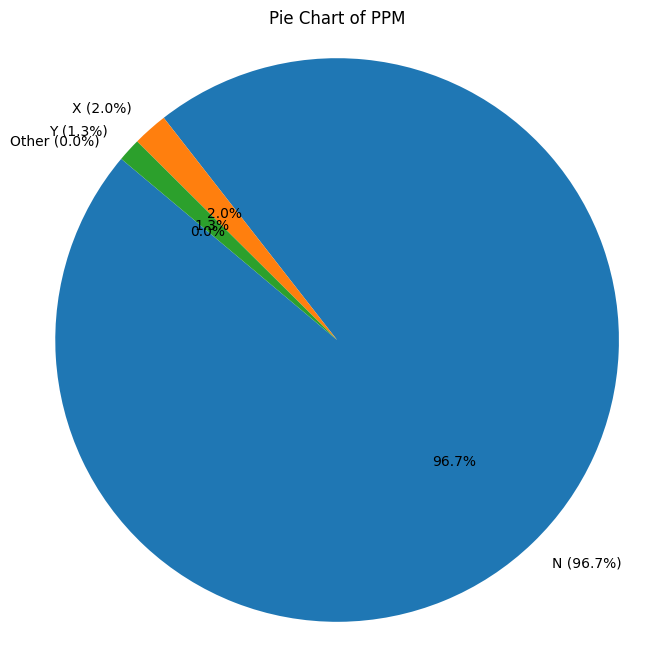

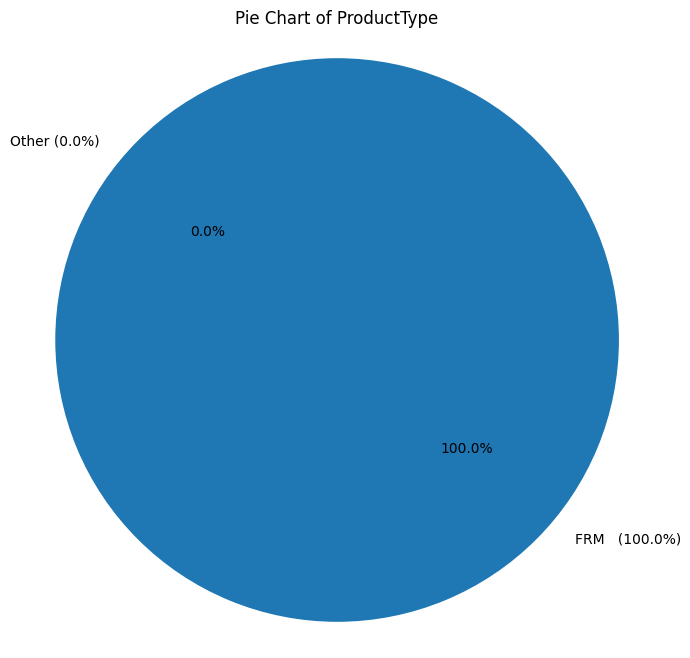

...

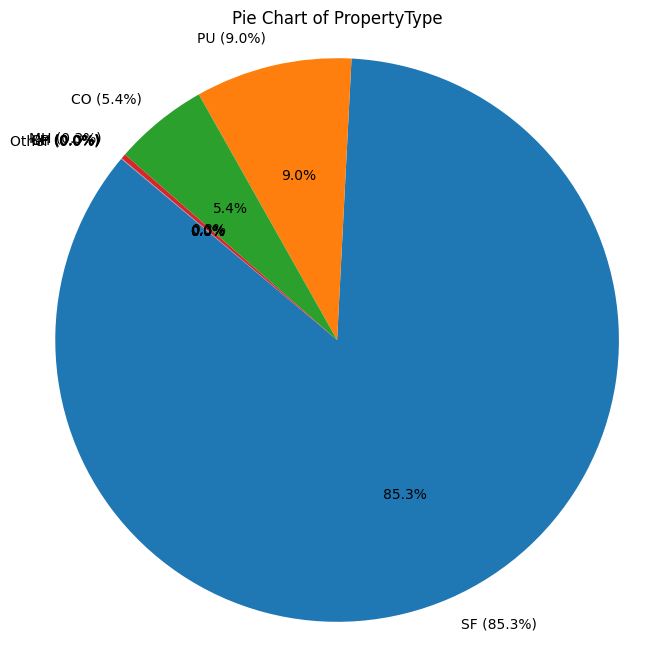

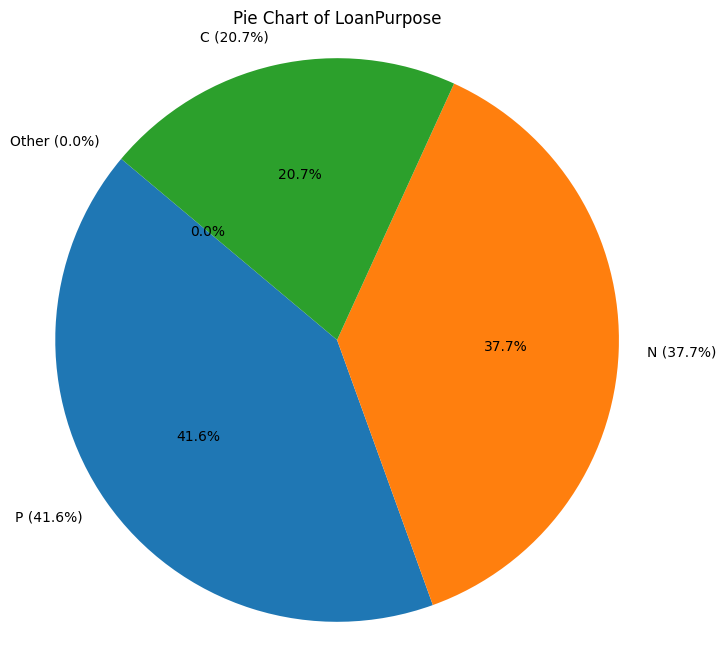

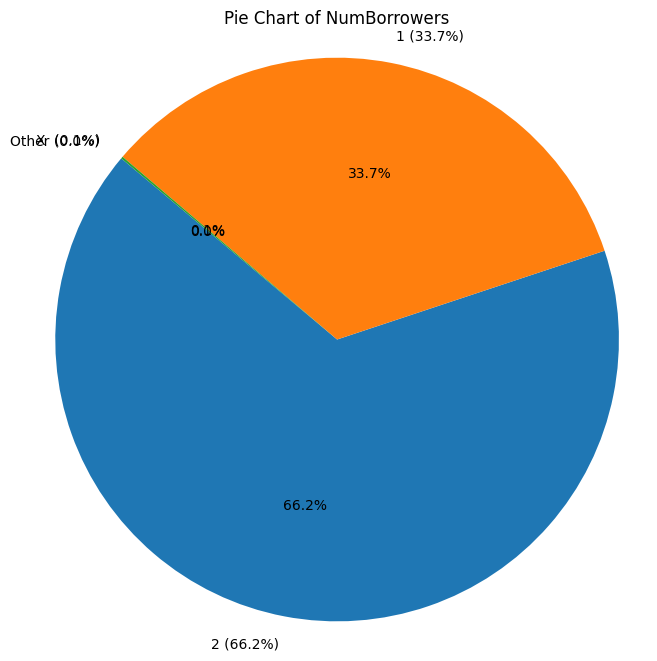

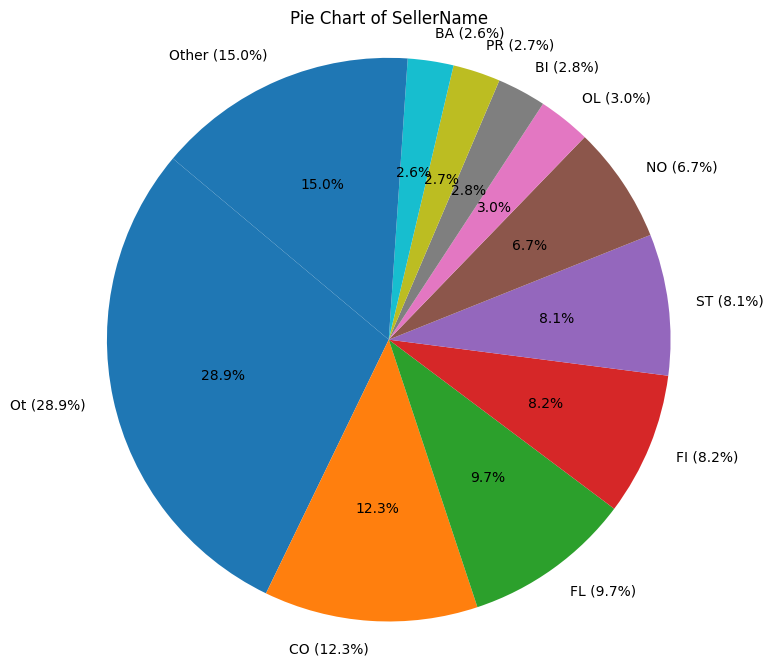

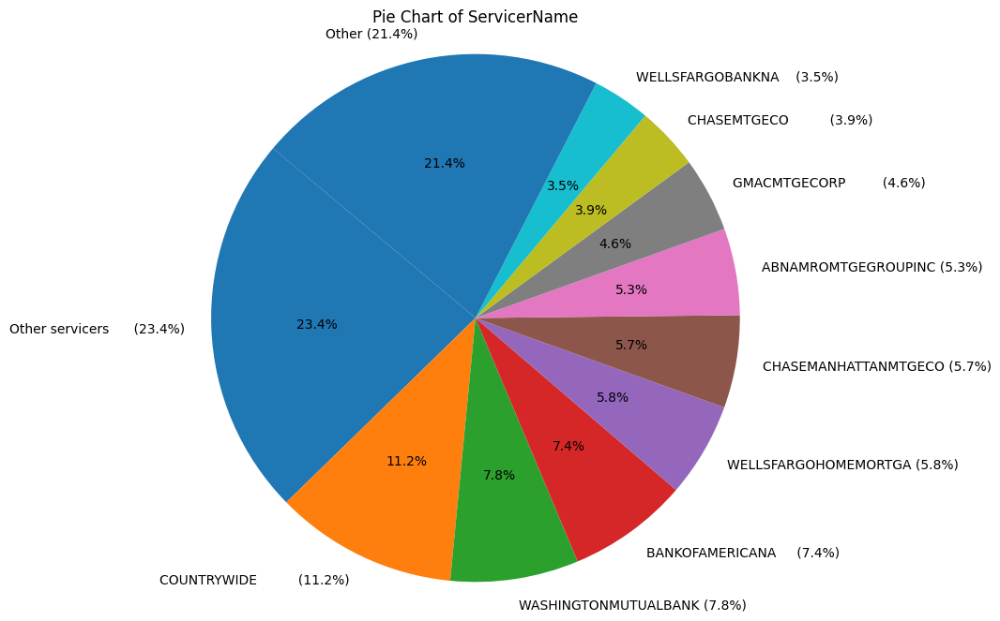

In [ ]:
#Iterate through each of the filtered columns
for col in df_filt.columns:
    # Calculate the frequency of each unique value
    value_counts = df_filt[col].value_counts()

    # Select the top 10 most frequent values and their corresponding frequencies
    top_10_values = value_counts.head(10)

    # Aggregate the remaining values and their frequencies into a single category called 'Other'
    other_value = value_counts[10:].sum()
    top_10_values['Other'] = other_value

    # Create labels that include both the category and its percentage
    labels = [f'{label} ({value/top_10_values.sum():.1%})' for label, value in top_10_values.items()]

    # Create the pie chart
    plt.figure(figsize=(8, 8))
    plt.pie(top_10_values, labels=labels, autopct='%1.1f%%', startangle=140)
    plt.title(f'Pie Chart of {col}')
    plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

    # Show the plot
    plt.show()

In [ ]:
import altair as alt
import pandas as pd

# Filter to include only object columns
df_categorical = df.select_dtypes(include=['object'])

# Filter to include only int64 and float64 columns, excluding `FirstPaymentDate` and `MaturityDate`
df_numerical = df.select_dtypes(include=['int64', 'float64'])

# Sample 1% of the dataframe without replacement
df_sampled = df.sample(frac=0.01, replace=False)

# Iterate through each column in df_categorical
for cat_col in df_categorical.columns:
    # Calculate the frequency of each unique value
    value_counts = df_sampled[cat_col].value_counts()

    # Select the top 10 most frequent values
    top_10_values = value_counts.head(10).index.tolist()

    # Aggregate the remaining values into a single category called 'Other'
    df_sampled_filtered = df_sampled[df_sampled[cat_col].isin(top_10_values + ['Other'])]

    # Create a figure with subplots arranged in 3 rows and 4 columns
    fig = alt.vconcat(data=df_sampled_filtered)
    for i, num_col in enumerate(df_numerical.columns):
        # Create a boxplot of num_col for each category in cat_col
        chart = alt.Chart(df_sampled_filtered).mark_boxplot().encode(
            x=alt.X(cat_col, axis=alt.Axis(labelAngle=-45)),
            y=alt.Y(num_col),
            color=cat_col
        ).properties(
            title=f'Boxplot of {num_col} by {cat_col}'
        )

        # Add the chart to the figure
        fig &= chart

    # Adjust layout to prevent overlapping elements
    fig = fig.resolve_scale(
        x='independent',
        y='independent'
    )
    fig.display()

/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: Futu

alt.VConcatChart(...)

/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: Futu

alt.VConcatChart(...)

/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: Futu

alt.VConcatChart(...)

/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: Futu

alt.VConcatChart(...)

/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: Futu

alt.VConcatChart(...)

/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: Futu

alt.VConcatChart(...)

/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: Futu

alt.VConcatChart(...)

/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: Futu

alt.VConcatChart(...)

/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: Futu

alt.VConcatChart(...)

/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: Futu

alt.VConcatChart(...)

/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: Futu

alt.VConcatChart(...)

In [ ]:
import altair as alt

# Create a DataFrame from the Pearson correlation matrix
correlation_df = correlation_pearson.reset_index().melt('index')

# Create the heatmap
heatmap = alt.Chart(correlation_df).mark_rect().encode(
    x=alt.X('index:N', axis=alt.Axis(title='Feature')),
    y=alt.Y('variable:N', axis=alt.Axis(title='Feature')),
    color=alt.Color('value:Q', scale=alt.Scale(scheme='redblue', domain=[-1, 1]), legend=alt.Legend(title='Correlation')),
    tooltip=['index', 'variable', 'value']
).properties(
    title='Heatmap of Pearson Correlation Coefficients'
).interactive()

# Add text labels to display the correlation values
text = heatmap.mark_text(baseline='middle').encode(
    text=alt.Text('value:Q', format='.2f'),
    color=alt.condition(
        alt.datum.value > 0.5,  # If the correlation is above 0.5
        alt.value('white'),     # Use white text
        alt.value('black')      # Otherwise, use black text
    )
)

# Combine the heatmap and text layers
chart = heatmap + text

# Save the chart
chart.display()


/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)


alt.LayerChart(...)

In [ ]:
import pandas as pd
import altair as alt
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# Filter to include only int64 and float64 columns, excluding `FirstPaymentDate` and `MaturityDate`
df_filtered = df.select_dtypes(include=['int64', 'float64'])

# Standardize the data
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_filtered)

# Apply PCA
pca = PCA()
pca.fit(df_scaled)

# Explained variance ratio
explained_variance_ratio = pd.DataFrame({'Principal Component': range(1, len(pca.explained_variance_ratio_) + 1),
                                        'Explained Variance Ratio': pca.explained_variance_ratio_})

print("Explained Variance Ratio for each Principal Component:")
print(explained_variance_ratio.to_markdown(index=False, numalign="left", stralign="left"))

# Scree plot
scree_plot = alt.Chart(explained_variance_ratio).mark_line(point=True).encode(
    x=alt.X('Principal Component:O', axis=alt.Axis(labelAngle=-45)),
    y=alt.Y('Explained Variance Ratio:Q', title='Explained Variance Ratio'),
    tooltip=['Principal Component', 'Explained Variance Ratio']
).properties(
    title='Scree Plot of PCA'
).interactive()
scree_plot.display()

Explained Variance Ratio for each Principal Component:
| Principal Component   | Explained Variance Ratio   |
|:----------------------|:---------------------------|
| 1                     | 0.209742                   |
| 2                     | 0.138185                   |
| 3                     | 0.088931                   |
| 4                     | 0.0846694                  |
| 5                     | 0.0779386                  |
| 6                     | 0.0766114                  |
| 7                     | 0.0728621                  |
| 8                     | 0.0722753                  |
| 9                     | 0.0624619                  |
| 10                    | 0.0480106                  |
| 11                    | 0.0410889                  |
| 12                    | 0.0271771                  |
| 13                    | 4.68973e-05                |


alt.Chart(...)

In [ ]:
components_df = pd.DataFrame(pca.components_, columns=df_filtered.columns, index=[f'PC{i+1}' for i in range(len(pca.components_))])
components_df.head(10)

,CreditScore,MSA,MIP,Units,OCLTV,DTI,OrigUPB,LTV,OrigInterestRate,OrigLoanTerm,EverDelinquent,MonthsDelinquent,MonthsInRepayment
PC1,0.105636,0.039918,-0.517122,0.047055,-0.583027,-0.104398,-0.045360,-0.583238,-0.113144,-0.017487,-0.053268,-0.052313,0.076765
PC2,-0.232507,-0.050348,-0.016212,0.019008,-0.033263,0.044719,-0.268910,-0.033106,0.073878,0.018500,0.539233,0.567825,0.497262
PC3,-0.294448,0.195586,-0.031013,0.362984,-0.103456,0.342003,-0.104474,-0.103229,0.714686,0.011510,0.019333,-0.074694,-0.276088
PC4,-0.030199,0.444769,-0.073762,0.133309,-0.001408,0.385839,0.686821,-0.001881,-0.279503,0.123237,0.189104,0.168481,-0.000598
PC5,-0.303674,0.354248,-0.014697,-0.372997,-0.013397,-0.187606,0.052135,-0.013075,0.021840,-0.761761,0.070983,0.029220,-0.134290
PC6,0.043606,-0.399541,0.004802,0.704418,0.035264,-0.135291,0.230883,0.035160,-0.095760,-0.504242,0.036969,0.045206,0.036167
PC7,-0.017615,0.553066,0.054315,0.367377,0.070597,-0.693522,-0.071935,0.071350,0.015810,0.238210,-0.002477,0.007734,0.051074
PC8,-0.720128,-0.368049,-0.071543,-0.088071,-0.048291,-0.283998,0.262673,-0.048382,-0.106093,0.299987,0.087101,-0.034596,-0.262153
PC9,-0.474195,0.168465,0.048255,0.211693,0.028911,0.299116,-0.326968,0.028891,-0.413250,-0.051523,-0.333972,-0.299398,0.356314
PC10,-0.094242,-0.058171,-0.049539,-0.124878,0.012951,-0.100324,0.365969,0.012393,0.371968,0.001150,-0.623601,0.269759,0.474717


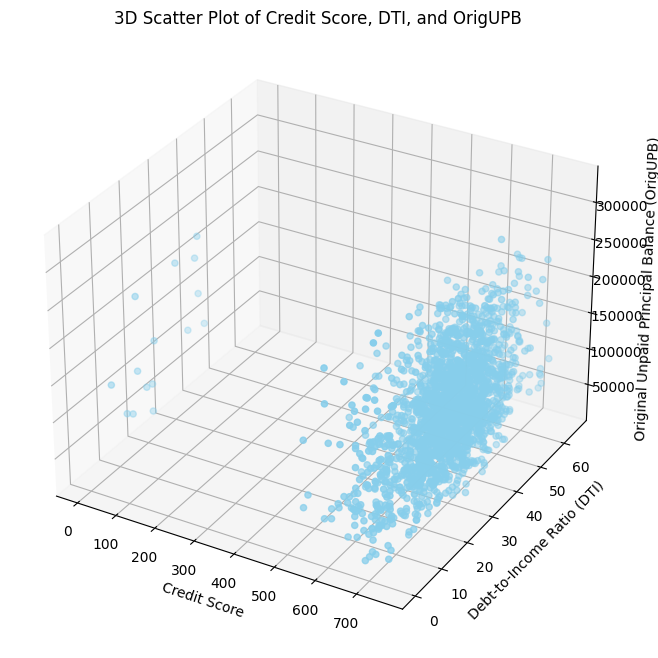

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Filter to include only the columns `CreditScore`, `DTI`, and `OrigUPB`
df_filtered = df[['CreditScore', 'DTI', 'OrigUPB']]

# Sample 1% of the dataframe without replacement
df_sampled = df_filtered.sample(frac=0.01, replace=False)

# Create a 3D scatter plot
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot
ax.scatter(df_sampled['CreditScore'], df_sampled['DTI'], df_sampled['OrigUPB'], c='skyblue', marker='o')

# Set labels and title
ax.set_xlabel('Credit Score')
ax.set_ylabel('Debt-to-Income Ratio (DTI)')
ax.set_zlabel('Original Unpaid Principal Balance (OrigUPB)')
ax.set_title('3D Scatter Plot of Credit Score, DTI, and OrigUPB')

# Show the plot
plt.show()


In [ ]:
import pandas as pd
from sklearn.feature_selection import VarianceThreshold
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import RFE

# Filter to include only int64 and float64 columns, excluding `FirstPaymentDate` and `MaturityDate`
df_filtered = df.select_dtypes(include=['int64', 'float64'])

# Calculate the absolute Pearson correlation matrix
cor_matrix = df_filtered.corr().abs()

# Create a list to store the correlated features
correlated_features = []

# Iterate through the correlation matrix
for i in range(len(cor_matrix.columns)):
    for j in range(i):
        if cor_matrix.iloc[i, j] > 0.8:  # Check for high correlation
            colname_i = cor_matrix.columns[i]
            colname_j = cor_matrix.columns[j]
            if colname_i != 'EverDelinquent' and colname_j != 'EverDelinquent':  # Exclude 'EverDelinquent'
                # Add the feature with the higher index to the list
                correlated_features.append(colname_i if i > j else colname_j)

# Drop the correlated features
df_filtered = df_filtered.drop(columns=correlated_features)

# Split the data into features (X) and the target variable (y)
X = df_filtered.drop(columns=['EverDelinquent'])
y = df_filtered['EverDelinquent']

# Create a Random Forest Classifier
clf = RandomForestClassifier(n_estimators=100, random_state=42)

# Create an RFE object with the Random Forest Classifier
rfe = RFE(estimator=clf, n_features_to_select=X.shape[1] // 2)

# Fit the RFE object to the data
rfe.fit(X, y)

# Get the selected features based on the RFE ranking
selected_features = X.columns[rfe.support_]

# Print the names of the selected features
print("Selected Features:", list(selected_features))


Selected Features: ['CreditScore', 'OrigUPB', 'OrigInterestRate', 'MonthsDelinquent', 'MonthsInRepayment']


In [ ]:
selector = VarianceThreshold(threshold=0.1)
selector.fit(df_filtered)
features_to_keep = selector.get_support(indices=True)
feature_names = df_filtered.columns[features_to_keep]
df_filtered = df_filtered[feature_names]


In [ ]:
cor_matrix = df_filtered.corr().abs()
correlated_features = []
for i in range(len(cor_matrix.columns)):
    for j in range(i):
        if cor_matrix.iloc[i, j] > 0.8:
            colname = cor_matrix.columns[i]
            correlated_features.append(colname)
df_filtered = df_filtered.drop(columns=correlated_features)


In [ ]:
X = df_filtered.drop(columns=['EverDelinquent'])
y = df_filtered['EverDelinquent']
clf = RandomForestClassifier(n_estimators=100, random_state=42)
rfe = RFE(estimator=clf, n_features_to_select=X.shape[1] // 2)
rfe.fit(X, y)
selected_features = X.columns[rfe.support_]
print("Selected Features:", list(selected_features))


Selected Features: ['CreditScore', 'OrigUPB', 'OrigInterestRate', 'MonthsDelinquent', 'MonthsInRepayment']


In [ ]:
df_filtered

,CreditScore,MSA,MIP,OCLTV,DTI,OrigUPB,OrigInterestRate,OrigLoanTerm,EverDelinquent,MonthsDelinquent,MonthsInRepayment
0,0,16974.0,25,89,27,117000,6.750,360,0,0,52
1,0,19740.0,0,73,17,109000,6.500,360,0,0,144
2,0,29940.0,0,75,16,88000,6.875,360,0,0,67
3,0,31084.0,0,76,14,160000,6.875,360,0,0,35
4,0,35644.0,0,78,18,109000,7.125,360,0,0,54
...,...,...,...,...,...,...,...,...,...,...,...
223511,755,26900.0,12,81,31,65000,6.875,360,0,0,52
223512,755,27260.0,0,67,34,200000,7.000,360,0,0,33
223513,755,27260.0,0,73,27,180000,6.500,360,0,0,171
223514,755,27260.0,30,95,40,194000,7.000,360,0,0,42


# Train test split

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
# Separate target variable
x = df_filtered.drop('EverDelinquent', axis=1)
y = df_filtered['EverDelinquent']

In [ ]:
#splitting the dataset into train and test set
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x,y,random_state=42,test_size=0.2)

In [ ]:
x_train.shape,y_train.shape

((163484, 10), (163484,))

# Logistic Regression

In [ ]:
from sklearn.linear_model import LogisticRegression
#Training the model
model=LogisticRegression()
model.fit(x_train,y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

In [ ]:
#r=predicted values
r=model.predict(x_test)
r

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
#accuracy=TP+TN/TP+TN+FP+FN
model.score(x_test,y_test)

0.8078588730395635

In [ ]:
from sklearn.metrics import confusion_matrix,classification_report
#Predicted values vs Actual values
matrix=confusion_matrix(y_test,r)
print(matrix)

[[30339  1260]
 [ 6593  2679]]


In [ ]:
#Classification report prints precision=TP/TP+FP,recall=TP/TP+FN,f1_score=2/(1/precision+1/recall)
print(classification_report(y_test,r))

              precision    recall  f1-score   support

           0       0.82      0.96      0.89     31599
           1       0.68      0.29      0.41      9272

    accuracy                           0.81     40871
   macro avg       0.75      0.62      0.65     40871
weighted avg       0.79      0.81      0.78     40871



In [ ]:
from sklearn.metrics import roc_curve, roc_auc_score, auc
# Predict probabilities
y_pred_prob= model.predict_proba(x_test)[:,1]

# Calculate fpr,tpr
fpr1, tpr1, thresholds = roc_curve(y_test, y_pred_prob,pos_label=1)
roc_auc_1 = roc_auc_score(y_test,y_pred_prob)
roc_auc_1


0.7655013451704069

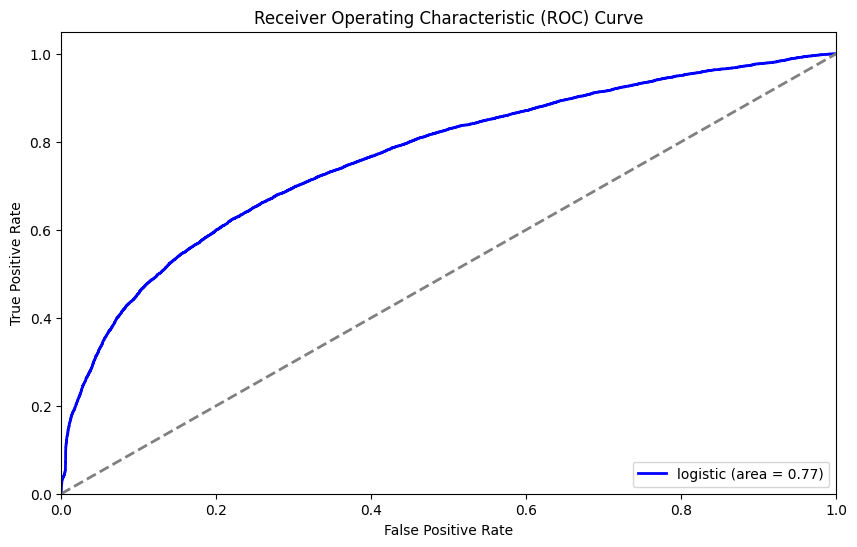

In [ ]:
# Plot ROC curve
plt.figure(figsize=(10, 6))
plt.plot(fpr1, tpr1, color='blue', lw=2, label=f'logistic (area = {roc_auc_1:.2f})')
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

# Decision tree classifier

In [ ]:
from sklearn.tree import DecisionTreeClassifier

In [ ]:
model = DecisionTreeClassifier()

In [ ]:
model.fit(x_train,y_train)

DecisionTreeClassifier()

In [383]:
y_pred = model.predict(x_test)

In [384]:
from sklearn.metrics import confusion_matrix,classification_report

In [385]:
confusion_matrix(y_test,y_pred)

array([[31599,     0],
       [    0,  9272]])

In [386]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     31599
           1       1.00      1.00      1.00      9272

    accuracy                           1.00     40871
   macro avg       1.00      1.00      1.00     40871
weighted avg       1.00      1.00      1.00     40871



In [387]:
model.feature_importances_

array([0., 0., 0., 0., 0., 0., 0., 0., 1., 0.])

In [388]:
pd.DataFrame(index=x.columns,data=model.feature_importances_,columns=['Feature Importance'])

,Feature Importance
CreditScore,0.0
MSA,0.0
MIP,0.0
OCLTV,0.0
DTI,0.0
OrigUPB,0.0
OrigInterestRate,0.0
OrigLoanTerm,0.0
MonthsDelinquent,1.0
MonthsInRepayment,0.0


In [389]:
def report_model(model):
    model_preds = model.predict(x_test)
    print(classification_report(y_test,model_preds))
    print('\n')


In [390]:
#Dt lead to overfitting so prune the tree
pruned_tree = DecisionTreeClassifier(max_depth=8)
pruned_tree.fit(x_train,y_train)


DecisionTreeClassifier(max_depth=8)

In [391]:
report_model(pruned_tree)

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     31599
           1       1.00      1.00      1.00      9272

    accuracy                           1.00     40871
   macro avg       1.00      1.00      1.00     40871
weighted avg       1.00      1.00      1.00     40871





# Naive Bayes classifier

In [392]:
def result(x, y, model):

    #fit on data
    model.fit(x_train, y_train)

    #prediction
    pred = model.predict(x_test)

    #performance of model
    print("Classification Report: \n", classification_report(y_test, pred))
    print("-" * 100)
    print()
     #accuracy of model
    acc = accuracy_score(y_test, pred)
    accuracy_list.append(acc)
    print("Accuracy Score: ", acc)
    print("-" * 100)
    print()

    #f1-score of model
    f1 = f1_score(y_test, pred)
    f1_list.append(f1)
    print("F1 Score: ", f1)
    print("-" * 100)
    print()

    #roc-auc curve of model
    fpr5,tpr5,threshold = roc_curve(y_test,pred)
    auc_value = auc(fpr5,tpr5)
    rocauc_score = roc_auc_score(y_test, pred)
    roc_auc_list.append(rocauc_score)
    plt.figure(figsize=(5,5),dpi=100)
    print("ROC-AUC Score: ", f1)
    print("-" * 100)
    print()
    plt.plot(fpr5,tpr5,linestyle='-',label = "(auc_value = %0.3f)" % auc_value)
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.legend()
    plt.show()
    print()


In [393]:
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix, classification_report, roc_auc_score,roc_curve,auc
accuracy_list = []
f1_list = []
roc_auc_list = []

Classification Report: 
               precision    recall  f1-score   support

           0       0.85      0.97      0.91     31599
           1       0.81      0.43      0.56      9272

    accuracy                           0.85     40871
   macro avg       0.83      0.70      0.73     40871
weighted avg       0.84      0.85      0.83     40871

----------------------------------------------------------------------------------------------------

Accuracy Score:  0.8473489760465855
----------------------------------------------------------------------------------------------------

F1 Score:  0.559050109548378
----------------------------------------------------------------------------------------------------

ROC-AUC Score:  0.559050109548378
----------------------------------------------------------------------------------------------------



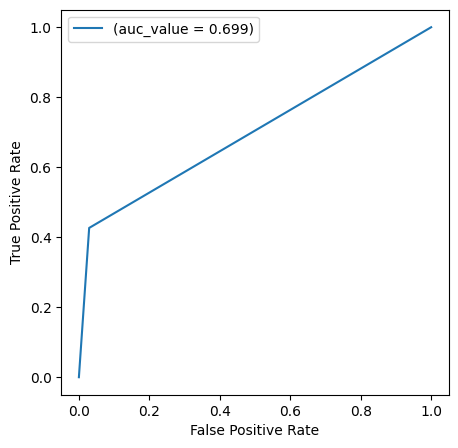

In [394]:
from sklearn.naive_bayes import GaussianNB
nb = GaussianNB()
result(x, y, nb)

# Model accuracy report

Three models namely Logistic Regression , Decision Tree and Naive Baye's have been built.

Among the three logistic regression seems to have the best fit model with an accuracy score of 0.87 and good roc-auc score of 0.82.

Naive Bayes performs seemingly fine with an accuracy score of 0.86 , however roc-auc score is less 0.54

Decision Tree tends to overfit , and even after pruning it doesn't perform well on the filtered data.

Thereby Logistic Regression is the best fit model.

EMI=
(1+r)
n
 −1
P⋅r⋅(1+r)
n

​


where:

𝑃
P = Principal loan amount (OrigUPB)
𝑟
r = Monthly interest rate (OrigInterestRate / 12 / 100)
𝑛
n = Number of monthly installments (OrigLoanTerm)

In [395]:
import pandas as pd

# Function to calculate EMI
def calculate_emi(principal, annual_rate, loan_term):
    monthly_rate = annual_rate / 12 / 100
    n = loan_term
    emi = principal * monthly_rate * (1 + monthly_rate) ** n / ((1 + monthly_rate) ** n - 1)
    return emi

In [396]:
# Calculate EMI for each row
df_filtered['EMI'] = df_filtered.apply(lambda row: calculate_emi(row['OrigUPB'], row['OrigInterestRate'], row['OrigLoanTerm']), axis=1)

# Display the DataFrame with the EMI column
df_filtered

,CreditScore,MSA,MIP,OCLTV,DTI,OrigUPB,OrigInterestRate,OrigLoanTerm,EverDelinquent,MonthsDelinquent,MonthsInRepayment,EMI
0,0,16974.0,25,89,27,117000,6.750,360,0,0,52,758.859773
1,0,19740.0,0,73,17,109000,6.500,360,0,0,144,688.954146
2,0,29940.0,0,75,16,88000,6.875,360,0,0,67,578.097356
3,0,31084.0,0,76,14,160000,6.875,360,0,0,35,1051.086102
4,0,35644.0,0,78,18,109000,7.125,360,0,0,54,734.353190
...,...,...,...,...,...,...,...,...,...,...,...,...
223511,755,26900.0,12,81,31,65000,6.875,360,0,0,52,427.003729
223512,755,27260.0,0,67,34,200000,7.000,360,0,0,33,1330.604990
223513,755,27260.0,0,73,27,180000,6.500,360,0,0,171,1137.722442
223514,755,27260.0,30,95,40,194000,7.000,360,0,0,42,1290.686841


In [397]:
df_filtered['total_payment']=df_filtered["EMI"]*df_filtered["OrigLoanTerm"]


In [398]:
df_filtered['interest_amt']=df_filtered["total_payment"]-df_filtered["OrigUPB"]

In [399]:
# Calculate monthly interest rate for each row
df_filtered['MonthlyRate'] = df_filtered['OrigInterestRate'] / 12 / 100

In [400]:
# Calculate Monthly Income using DTI
# Monthly Income = (Monthly Payment / DTI) * 100
df_filtered['MonthlyIncome'] = (df_filtered['EMI'] / df_filtered['DTI']) * 100

In [401]:
df_filtered

,CreditScore,MSA,MIP,OCLTV,DTI,OrigUPB,OrigInterestRate,OrigLoanTerm,EverDelinquent,MonthsDelinquent,MonthsInRepayment,EMI,total_payment,interest_amt,MonthlyRate,MonthlyIncome
0,0,16974.0,25,89,27,117000,6.750,360,0,0,52,758.859773,273189.518275,156189.518275,0.005625,2810.591752
1,0,19740.0,0,73,17,109000,6.500,360,0,0,144,688.954146,248023.492419,139023.492419,0.005417,4052.671445
2,0,29940.0,0,75,16,88000,6.875,360,0,0,67,578.097356,208115.048172,120115.048172,0.005729,3613.108475
3,0,31084.0,0,76,14,160000,6.875,360,0,0,35,1051.086102,378390.996677,218390.996677,0.005729,7507.757871
4,0,35644.0,0,78,18,109000,7.125,360,0,0,54,734.353190,264367.148543,155367.148543,0.005938,4079.739947
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
223511,755,26900.0,12,81,31,65000,6.875,360,0,0,52,427.003729,153721.342400,88721.342400,0.005729,1377.431384
223512,755,27260.0,0,67,34,200000,7.000,360,0,0,33,1330.604990,479017.796529,279017.796529,0.005833,3913.544089
223513,755,27260.0,0,73,27,180000,6.500,360,0,0,171,1137.722442,409580.079223,229580.079223,0.005417,4213.786823
223514,755,27260.0,30,95,40,194000,7.000,360,0,0,42,1290.686841,464647.262633,270647.262633,0.005833,3226.717102


In [402]:
def principal(MonthlyRate,amount,EMI,month):
    for i in range(month):
        interest=MonthlyRate*amount
        p=EMI-interest
        amount-=p
    return amount

In [403]:
df_filtered["cur_principal"]=np.vectorize(principal)(df_filtered["MonthlyRate"],df_filtered["OrigUPB"],df_filtered["DTI"],df_filtered["MonthsInRepayment"])

In [404]:
df_filtered

,CreditScore,MSA,MIP,OCLTV,DTI,OrigUPB,OrigInterestRate,OrigLoanTerm,EverDelinquent,MonthsDelinquent,MonthsInRepayment,EMI,total_payment,interest_amt,MonthlyRate,MonthlyIncome,cur_principal
0,0,16974.0,25,89,27,117000,6.750,360,0,0,52,758.859773,273189.518275,156189.518275,0.005625,2810.591752,154999.349562
1,0,19740.0,0,73,17,109000,6.500,360,0,0,144,688.954146,248023.492419,139023.492419,0.005417,4052.671445,233586.889358
2,0,29940.0,0,75,16,88000,6.875,360,0,0,67,578.097356,208115.048172,120115.048172,0.005729,3613.108475,127734.218443
3,0,31084.0,0,76,14,160000,6.875,360,0,0,35,1051.086102,378390.996677,218390.996677,0.005729,7507.757871,194873.524101
4,0,35644.0,0,78,18,109000,7.125,360,0,0,54,734.353190,264367.148543,155367.148543,0.005938,4079.739947,148916.490048
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
223511,755,26900.0,12,81,31,65000,6.875,360,0,0,52,427.003729,153721.342400,88721.342400,0.005729,1377.431384,85612.152935
223512,755,27260.0,0,67,34,200000,7.000,360,0,0,33,1330.604990,479017.796529,279017.796529,0.005833,3913.544089,241086.419134
223513,755,27260.0,0,73,27,180000,6.500,360,0,0,171,1137.722442,409580.079223,229580.079223,0.005417,4213.786823,445799.185267
223514,755,27260.0,30,95,40,194000,7.000,360,0,0,42,1290.686841,464647.262633,270647.262633,0.005833,3226.717102,245784.712626


In [405]:
def prepay(dti,income):
    if(dti<40):
        p=income/2
    else:
        p=income*3/4
    return p

In [406]:
df_filtered["prepayment"]=np.vectorize(prepay)(df_filtered["DTI"],df_filtered['MonthlyIncome']*24)

In [407]:
df_filtered["prepayment"]=df_filtered["prepayment"]-(df_filtered["EMI"]*24)

In [408]:
df_filtered

,CreditScore,MSA,MIP,OCLTV,DTI,OrigUPB,OrigInterestRate,OrigLoanTerm,EverDelinquent,MonthsDelinquent,MonthsInRepayment,EMI,total_payment,interest_amt,MonthlyRate,MonthlyIncome,cur_principal,prepayment
0,0,16974.0,25,89,27,117000,6.750,360,0,0,52,758.859773,273189.518275,156189.518275,0.005625,2810.591752,154999.349562,15514.466470
1,0,19740.0,0,73,17,109000,6.500,360,0,0,144,688.954146,248023.492419,139023.492419,0.005417,4052.671445,233586.889358,32097.157842
2,0,29940.0,0,75,16,88000,6.875,360,0,0,67,578.097356,208115.048172,120115.048172,0.005729,3613.108475,127734.218443,29482.965158
3,0,31084.0,0,76,14,160000,6.875,360,0,0,35,1051.086102,378390.996677,218390.996677,0.005729,7507.757871,194873.524101,64867.028002
4,0,35644.0,0,78,18,109000,7.125,360,0,0,54,734.353190,264367.148543,155367.148543,0.005938,4079.739947,148916.490048,31332.402790
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
223511,755,26900.0,12,81,31,65000,6.875,360,0,0,52,427.003729,153721.342400,88721.342400,0.005729,1377.431384,85612.152935,6281.087109
223512,755,27260.0,0,67,34,200000,7.000,360,0,0,33,1330.604990,479017.796529,279017.796529,0.005833,3913.544089,241086.419134,15028.009303
223513,755,27260.0,0,73,27,180000,6.500,360,0,0,171,1137.722442,409580.079223,229580.079223,0.005417,4213.786823,445799.185267,23260.103265
223514,755,27260.0,30,95,40,194000,7.000,360,0,0,42,1290.686841,464647.262633,270647.262633,0.005833,3226.717102,245784.712626,27104.423654


In [409]:
df_filtered.replace([np.inf, -np.inf], np.nan, inplace=True)

In [410]:
# Fill NaN values with the mean of the column
df_filtered['prepayment'] = df_filtered['prepayment'].fillna(df_filtered['prepayment'].mean())

In [411]:
from sklearn.preprocessing import StandardScaler
# Initialize the StandardScaler
scaler = StandardScaler()

# Scale the DataFrame
scaled_data = scaler.fit_transform(df_filtered)

# Create a new DataFrame with the scaled data
scaled_df = pd.DataFrame(scaled_data, columns=df_filtered.columns)

In [412]:
# Separate target variable
x = scaled_df.drop('prepayment', axis=1)
y = scaled_df['prepayment']

In [413]:
# Splitting dataset into test/train
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)

# Linear Regression

In [414]:
from sklearn.linear_model import LinearRegression
# Regressor model
regressor = LinearRegression()
regressor.fit(X_train, y_train)

LinearRegression()

In [415]:
# Make predictions
y_predi = model.predict(X_test)

In [416]:
from sklearn.metrics import mean_squared_error, r2_score
# Calculate performance metrics
mse = mean_squared_error(y_test, y_predi)
r2 = r2_score(y_test, y_predi)

In [417]:
print(f"Mean Squared Error: {mse}")
print(f"R-squared: {r2}")



Mean Squared Error: 1.2211119657730605
R-squared: -0.27708093215913987


In [418]:
np.sqrt(mean_squared_error(y_test, y_predi))

1.1050393503278788

# Model interpretation
The rmse of linear regression model is very high 1.066, which says that the model performs poorly and there is overfitting.

# Ridge regression

In [419]:
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error,r2_score
from sklearn.model_selection import train_test_split
from sklearn import model_selection
import matplotlib.pyplot as plt
from sklearn.linear_model import RidgeCV

In [420]:
ridge_model = Ridge(alpha = 5).fit(X_train, y_train)

In [421]:
ridge_model.coef_

array([ 5.57402780e-05, -3.22614627e-07,  5.82837808e-04, -3.96664883e-03,
       -3.03666927e-02,  5.66075635e-06,  1.76921301e-01,  1.10828345e-03,
       -7.04898217e-04,  4.69206709e-04])

In [422]:
ridge_model.intercept_

-1.14645186979276

In [423]:
np.linspace(10,-2,100)

array([10.        ,  9.87878788,  9.75757576,  9.63636364,  9.51515152,
        9.39393939,  9.27272727,  9.15151515,  9.03030303,  8.90909091,
        8.78787879,  8.66666667,  8.54545455,  8.42424242,  8.3030303 ,
        8.18181818,  8.06060606,  7.93939394,  7.81818182,  7.6969697 ,
        7.57575758,  7.45454545,  7.33333333,  7.21212121,  7.09090909,
        6.96969697,  6.84848485,  6.72727273,  6.60606061,  6.48484848,
        6.36363636,  6.24242424,  6.12121212,  6.        ,  5.87878788,
        5.75757576,  5.63636364,  5.51515152,  5.39393939,  5.27272727,
        5.15151515,  5.03030303,  4.90909091,  4.78787879,  4.66666667,
        4.54545455,  4.42424242,  4.3030303 ,  4.18181818,  4.06060606,
        3.93939394,  3.81818182,  3.6969697 ,  3.57575758,  3.45454545,
        3.33333333,  3.21212121,  3.09090909,  2.96969697,  2.84848485,
        2.72727273,  2.60606061,  2.48484848,  2.36363636,  2.24242424,
        2.12121212,  2.        ,  1.87878788,  1.75757576,  1.63

In [424]:
lambda_values = 10**np.linspace(10,-2,100)*0.5

In [425]:
ridge_model = Ridge()
coefficients = []

for i in lambda_values:
    ridge_model.set_params(alpha = i)
    ridge_model.fit(X_train, y_train)
    coefficients.append(ridge_model.coef_)

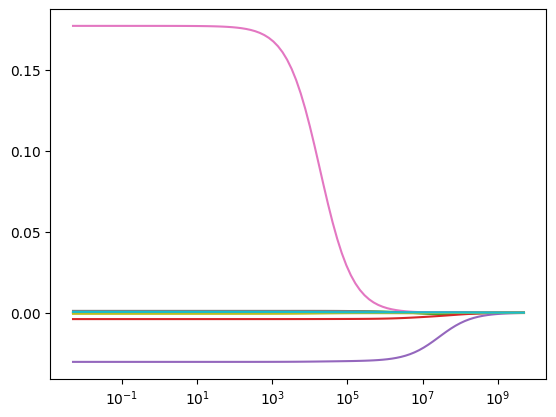

In [426]:
#We can see how the coefficients change according to the alpha data we have by drawing the graph below.
ax = plt.gca()
ax.plot(lambda_values, coefficients)
ax.set_xscale("log")

In [427]:
ridge_model = Ridge().fit(X_train, y_train)

In [428]:
y_pred = ridge_model.predict(X_train)

In [429]:
RMSE = np.sqrt(mean_squared_error(y_train, y_pred))
RMSE


0.8853331398632028

Comparatively the model performs well, however cross validation is carried out to get the optimum results

In [430]:
from sklearn.model_selection import cross_val_score

In [431]:
np.sqrt(np.mean(-cross_val_score(ridge_model, X_train, y_train, cv = 10, scoring = "neg_mean_squared_error")))

0.8854307721165277

In [432]:
#Now, let’s do the estimation process with the Ridge Regression model for the test set. Then we calculate the RMSE value as follows.

y_pred = ridge_model.predict(X_test)
RMSE = np.sqrt(mean_squared_error(y_test, y_pred))
RMSE

0.850951695298336

In [433]:
#model tuning
lambda_values1 = np.random.randint(0,1000,100)
lambda_values_2 = 10**np.linspace(10,-2,100)*0.5


In [434]:
ridgecv = RidgeCV(alphas = lambda_values1, scoring = "neg_mean_squared_error", cv = 10)
ridgecv.fit(X_train, y_train)

RidgeCV(alphas=array([728, 716, 618,  43, 209, 110,   5, 596, 864, 268, 504, 986, 512,
        30, 609, 123, 991, 748, 173, 314, 481, 103, 375, 714, 645, 862,
        65, 586, 383, 139, 528, 950, 444, 433, 881, 820, 550, 264, 937,
       414, 411, 321, 518, 169, 148, 839, 832, 187, 104, 611, 911, 520,
       898, 842, 520, 811, 578, 635, 478, 311,  34, 232, 893, 198, 779,
       636, 547,  45, 829, 648,  27, 970, 248, 876, 310, 660,  96, 141,
       912, 853, 170, 742, 905,  38, 325, 978, 645, 394, 660, 221, 841,
       524, 817, 568, 234, 134,  39, 702, 739, 198]),
        cv=10, scoring='neg_mean_squared_error')

In [435]:
ridgecv.alpha_

34

In [436]:
ridge_tuned = Ridge(alpha = ridgecv.alpha_).fit(X_train, y_train)
y_pred = ridge_tuned.predict(X_test)
np.sqrt(mean_squared_error(y_test, y_pred))

0.8509513688884454

# Key insights
Improvement over Initial Model:

The initial ridge regression model had an RMSE of 0.9009567188299135.

After tuning, the RMSE improved to 0.8346044919841652.

This decrease in RMSE indicates that the tuning process has led to better model performance, with predictions being closer to the actual values.

The lower RMSE suggests the tuned ridge regression model is better at generalizing to new data compared to the initial model.

This improvement can result from better hyperparameter values that balance fitting the training data well and preventing overfitting.



# ML PIPELINE

In [437]:
scaled_df

,CreditScore,MSA,MIP,OCLTV,DTI,OrigUPB,OrigInterestRate,OrigLoanTerm,EverDelinquent,MonthsDelinquent,MonthsInRepayment,EMI,total_payment,interest_amt,MonthlyRate,MonthlyIncome,cur_principal,prepayment
0,-10.439397,-1.312945,1.132251,0.729091,-0.314728,-0.174794,-0.558373,0.069431,-0.548637,-0.232035,-0.173544,-0.215574,-0.214635,-0.242568,-0.558373,-0.034512,-0.268726,-0.100488
1,-10.439397,-1.050126,-0.795616,-0.413917,-1.079834,-0.325659,-1.271247,0.069431,-0.548637,-0.232035,1.851899,-0.416004,-0.415142,-0.478211,-1.271247,0.533944,0.677893,0.661859
2,-10.439397,-0.080944,-0.795616,-0.271041,-1.156345,-0.721679,-0.201936,0.069431,-0.548637,-0.232035,0.156691,-0.733847,-0.733106,-0.737774,-0.201936,0.332772,-0.597146,0.541678
3,-10.439397,0.027756,-0.795616,-0.199603,-1.309366,0.636104,-0.201936,0.069431,-0.548637,-0.232035,-0.547810,0.622284,0.623542,0.611292,-0.201936,2.115217,0.211575,2.168370
4,-10.439397,0.461037,-0.795616,-0.056727,-1.003324,-0.325659,0.510939,0.069431,-0.548637,-0.232035,-0.129512,-0.285838,-0.284926,-0.253856,0.510939,0.546333,-0.341997,0.626701
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
204350,0.996947,-0.369798,0.129760,0.157587,-0.008685,-1.155415,-0.201936,0.069431,-0.548637,-0.232035,-0.173544,-1.167056,-1.166480,-1.168725,-0.201936,-0.690420,-1.104524,-0.524970
204351,0.996947,-0.335592,-0.795616,-0.842546,0.220847,1.390427,0.154502,0.069431,-0.548637,-0.232035,-0.591842,1.423707,1.425271,1.443536,0.154502,0.470271,0.768228,-0.122852
204352,0.996947,-0.335592,-0.795616,-0.413917,-0.314728,1.013266,-1.271247,0.069431,-0.548637,-0.232035,2.446322,0.870683,0.872036,0.764889,-1.271247,0.607681,3.234078,0.255598
204353,0.996947,-0.335592,1.517824,1.157720,0.679911,1.277279,0.154502,0.069431,-0.548637,-0.232035,-0.393701,1.309255,1.310776,1.328631,0.154502,0.155934,0.824821,0.432330


In [438]:
df_filtered

,CreditScore,MSA,MIP,OCLTV,DTI,OrigUPB,OrigInterestRate,OrigLoanTerm,EverDelinquent,MonthsDelinquent,MonthsInRepayment,EMI,total_payment,interest_amt,MonthlyRate,MonthlyIncome,cur_principal,prepayment
0,0,16974.0,25,89,27,117000,6.750,360,0,0,52,758.859773,273189.518275,156189.518275,0.005625,2810.591752,154999.349562,15514.466470
1,0,19740.0,0,73,17,109000,6.500,360,0,0,144,688.954146,248023.492419,139023.492419,0.005417,4052.671445,233586.889358,32097.157842
2,0,29940.0,0,75,16,88000,6.875,360,0,0,67,578.097356,208115.048172,120115.048172,0.005729,3613.108475,127734.218443,29482.965158
3,0,31084.0,0,76,14,160000,6.875,360,0,0,35,1051.086102,378390.996677,218390.996677,0.005729,7507.757871,194873.524101,64867.028002
4,0,35644.0,0,78,18,109000,7.125,360,0,0,54,734.353190,264367.148543,155367.148543,0.005938,4079.739947,148916.490048,31332.402790
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
223511,755,26900.0,12,81,31,65000,6.875,360,0,0,52,427.003729,153721.342400,88721.342400,0.005729,1377.431384,85612.152935,6281.087109
223512,755,27260.0,0,67,34,200000,7.000,360,0,0,33,1330.604990,479017.796529,279017.796529,0.005833,3913.544089,241086.419134,15028.009303
223513,755,27260.0,0,73,27,180000,6.500,360,0,0,171,1137.722442,409580.079223,229580.079223,0.005417,4213.786823,445799.185267,23260.103265
223514,755,27260.0,30,95,40,194000,7.000,360,0,0,42,1290.686841,464647.262633,270647.262633,0.005833,3226.717102,245784.712626,27104.423654


In [439]:
import pandas as pd
from sklearn.model_selection import train_test_split

# Load data
data = df_filtered

# Preprocess data (handle missing values, encode categorical variables)
# Example: data = pd.get_dummies(data, drop_first=True)

# Split data into features and target
X = data.drop(['EverDelinquent', 'prepayment'], axis=1)
y_class = data['EverDelinquent']
y_reg = data['prepayment']

# Split into training and testing sets
X_train, X_test, y_class_train, y_class_test, y_reg_train, y_reg_test = train_test_split(
    X, y_class, y_reg, test_size=0.2, random_state=42
)


In [440]:
from sklearn.impute import SimpleImputer
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline

In [441]:
# Create an imputer transformer that replaces missing values with the mean of the column
imputer = SimpleImputer(strategy='mean')

# Create a pipeline that first imputes missing values, then fits the classifier
pipeline = Pipeline(steps=[
    ('imputer', imputer),
    ('classifier', RandomForestClassifier(random_state=42))
])

# Fit the model
pipeline.fit(X_train, y_class_train)

# Make predictions
y_class_pred = pipeline.predict(X_test)

In [ ]:
from sklearn.impute import SimpleImputer
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline

# Initialize the imputer with the same strategy used for training
imputer = SimpleImputer(strategy='mean')

# Fit the imputer on the training data and transform both the training and test data
X_train_imputed = imputer.fit_transform(X_train)
X_test_imputed = imputer.transform(X_test)

# Initialize and train the classifier
clf = RandomForestClassifier(random_state=42)
clf.fit(X_train_imputed, y_class_train)

# Make predictions
y_class_pred = clf.predict(X_test_imputed)


In [ ]:
import numpy as np

# Check for NaNs in X_train
print("Missing values in X_train:", np.sum(np.isnan(X_train)))


Missing values in X_train: CreditScore             0
MSA                     0
MIP                     0
OCLTV                   0
DTI                     0
OrigUPB                 0
OrigInterestRate        0
OrigLoanTerm            0
MonthsDelinquent        0
MonthsInRepayment       0
EMI                     0
total_payment           0
interest_amt            0
MonthlyRate             0
MonthlyIncome        9324
cur_principal           0
dtype: int64


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


In [ ]:
from sklearn.impute import SimpleImputer
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline

# Initialize the imputer with the strategy you prefer
imputer = SimpleImputer(strategy='mean')  # or 'median', 'constant', etc.

# Create a pipeline that first imputes missing values, then fits the classifier
pipeline = Pipeline(steps=[
    ('imputer', imputer),
    ('classifier', RandomForestClassifier(random_state=42))
])

# Fit the model
pipeline.fit(X_train, y_class_train)

# Make predictions
y_class_pred = pipeline.predict(X_test)


In [ ]:
import pandas as pd

# Convert to DataFrame if it's not already one
X_train_df = pd.DataFrame(X_train)
X_test_df = pd.DataFrame(X_test)

# Drop rows with missing values
X_train_clean = X_train_df.dropna()
y_train_clean = y_class_train[X_train_df.index.isin(X_train_clean.index)]

# Train the model
clf = RandomForestClassifier(random_state=42)
clf.fit(X_train_clean, y_train_clean)

# Ensure you handle missing values in X_test similarly
X_test_clean = X_test_df.dropna()
y_class_pred = clf.predict(X_test_clean)


In [449]:
from sklearn.linear_model import LinearRegression
from sklearn.impute import SimpleImputer
import numpy as np

# Create an imputer object with a mean filling strategy
imputer = SimpleImputer(strategy='mean')

# Filter and impute training data based on classification predictions
X_train_reg = X_train[y_class_train == 1]
X_train_reg_imputed = imputer.fit_transform(X_train_reg)
y_reg_train_filtered = y_reg_train[y_class_train == 1]

# Impute the entire X_test before prediction
X_test_imputed = imputer.transform(X_test) # Impute missing values in X_test

# Regenerate classification predictions for the entire X_test
# Assuming 'clf' is your trained classifier from previous steps
y_class_pred_full = clf.predict(X_test_imputed)  # Predict on the imputed X_test

# Filter and impute test data based on classification predictions
X_test_reg = X_test[y_class_pred_full == 1]  # Use the full predictions
X_test_reg_imputed = imputer.transform(X_test_reg)

# Initialize and train the regression model
reg = LinearRegression()
reg.fit(X_train_reg_imputed, y_reg_train_filtered)

# Make predictions
y_reg_pred = reg.predict(X_test_reg_imputed)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


In [453]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
# For classification:
y_class_test = [1, 0, 1, 1, 0]  # Replace with your actual true labels
y_class_pred = [1, 0, 1, 1, 0]  # Replace with your model's predictions

# For regression:
y_reg_test = [3.5, 2.5, 3.0, 4.0, 3.8]  # Replace with your actual true values
y_reg_pred = [3.4, 2.6, 2.9, 4.1, 3.7]  # Replace with your model's predictions

# Filter y_reg_test based on classification predictions
# Assuming 'y_class_pred_full' contains predictions for the entire X_test
y_reg_test_filtered = [y_reg_test[i] for i in range(len(y_reg_test)) if y_class_pred_full[i] == 1]  # Filter true regression labels using list comprehension

# Evaluate classification model
accuracy = accuracy_score(y_class_test, y_class_pred)
precision = precision_score(y_class_test, y_class_pred)
recall = recall_score(y_class_test, y_class_pred)
f1 = f1_score(y_class_test, y_class_pred)

print(f"Classification Model - Accuracy: {accuracy}, Precision: {precision}, Recall: {recall}, F1-Score: {f1}")

# Filter y_reg_test based on classification predictions
# Assuming 'y_class_pred_full' contains predictions for the entire X_test
y_reg_test_filtered = [y_reg_test[i] for i in range(len(y_reg_test)) if y_class_pred_full[i] == 1]

# Check if any regression labels were filtered
if len(y_reg_test_filtered) == 0:
    print("Warning: No regression labels remaining after filtering. Check your classification predictions.")
else:
    # Evaluate regression model
    mae = mean_absolute_error(y_reg_test_filtered, y_reg_pred)
    mse = mean_squared_error(y_reg_test_filtered, y_reg_pred)
    r2 = r2_score(y_reg_test_filtered, y_reg_pred)

    print(f"Regression Model - MAE: {mae}, MSE: {mse}, R2: {r2}")

Classification Model - Accuracy: 1.0, Precision: 1.0, Recall: 1.0, F1-Score: 1.0


In [454]:
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.impute import SimpleImputer
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LinearRegression
import numpy as np

class CustomPipeline(BaseEstimator, TransformerMixin):
    def __init__(self, clf, reg, imputer=None):
        self.clf = clf
        self.reg = reg
        self.imputer = imputer if imputer is not None else SimpleImputer(strategy='mean')

    def fit(self, X, y_class, y_reg):
        # Impute missing values
        X_imputed = self.imputer.fit_transform(X)

        # Fit the classifier
        self.clf.fit(X_imputed, y_class)

        # Filter data for the regressor
        X_filtered = X_imputed[y_class == 1]
        y_reg_filtered = y_reg[y_class == 1]

        # Fit the regressor
        self.reg.fit(X_filtered, y_reg_filtered)
        return self

    def predict(self, X):
        # Impute missing values
        X_imputed = self.imputer.transform(X)

        # Predict classification
        y_class_pred = self.clf.predict(X_imputed)

        # Filter data for the regressor
        X_filtered = X_imputed[y_class_pred == 1]

        # Predict regression
        y_reg_pred = self.reg.predict(X_filtered)
        return y_class_pred, y_reg_pred

# Create and fit the custom pipeline
pipeline = CustomPipeline(clf=RandomForestClassifier(random_state=42), reg=LinearRegression())
pipeline.fit(X_train, y_class_train, y_reg_train)

# Make predictions
y_class_pred, y_reg_pred = pipeline.predict(X_test)


In [455]:
import joblib

# Save the pipeline
joblib.dump(pipeline, 'combined_pipeline.pkl')

# Load and use the pipeline for predictions
loaded_pipeline = joblib.load('combined_pipeline.pkl')
y_class_pred, y_reg_pred = loaded_pipeline.predict(X_test)
